# Exploration 7: Shallow Focus - Semantic Segmentation

---

#### Model
* DeepLab Model

#### Datasets
* Pictures are downloaded from [pixabay](https://pixabay.com/) and [unsplash](https://unsplash.com/)

#### Goals

1. Use different images
2. Define problems with semantic segmentation
3. Suggest a way to improve
---

## Importing Dependencies

laying the foundation to build my model on

In [1]:
import os, urllib, cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt
import tensorflow as tf

print("All imported!")

All imported!


---

## Importing Image 01: Human

(4220, 3376, 3)


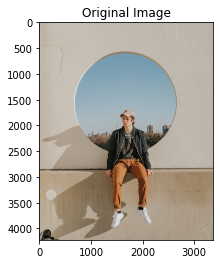

In [2]:
h_img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/person1.jpg'  
h_img_orig = cv2.imread(h_img_path) 

print(h_img_orig.shape)
plt.imshow(cv2.cvtColor(h_img_orig, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.show()

## Semantic Segmentation

Using DeepLab model

In [3]:
#downloading DeepLab model from PixelLib
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

urllib.request.urlretrieve(model_url, model_file)

model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

<function matplotlib.pyplot.show(close=None, block=None)>

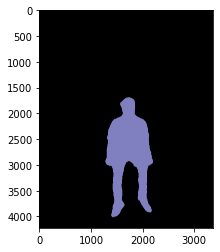

In [4]:
#inputing image into the model
segvalues, output = model.segmentAsPascalvoc(h_img_path)

plt.imshow(output)
plt.show

In [5]:
segvalues

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [6]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[15] #human

array([192, 128, 128])

In [7]:
seg_color = (128, 128, 192) #converting color from BGR to RGB

(4220, 3376)


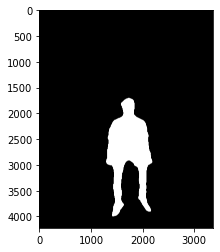

In [8]:
#masking by seg_color, if same then 1(True), if not then 0(False)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

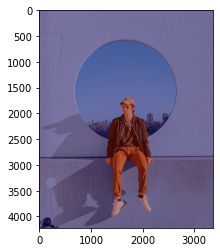

In [9]:
h_img_show = h_img_orig.copy()

h_img_mask = seg_map.astype(np.uint8) * 255

#applying color
h_color_mask = cv2.applyColorMap(h_img_mask, cv2.COLORMAP_JET)

#0.6 and 0.4 are the ratio of original image and mask image
h_img_show = cv2.addWeighted(h_img_show, 0.6, h_color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(h_img_show, cv2.COLOR_BGR2RGB))
plt.show()

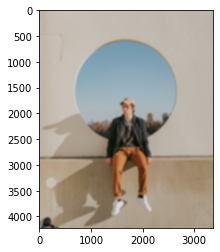

In [10]:
#blur the image
h_img_orig_blur = cv2.blur(h_img_orig, (50,50))  
plt.imshow(cv2.cvtColor(h_img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

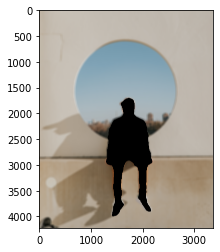

In [11]:
#extract the background of blurred image by using segmentation mask
h_img_mask_color = cv2.cvtColor(h_img_mask, cv2.COLOR_GRAY2BGR)
h_img_bg_mask = cv2.bitwise_not(h_img_mask_color)
h_img_bg_blur = cv2.bitwise_and(h_img_orig_blur, h_img_bg_mask)
plt.imshow(cv2.cvtColor(h_img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

## Comparison

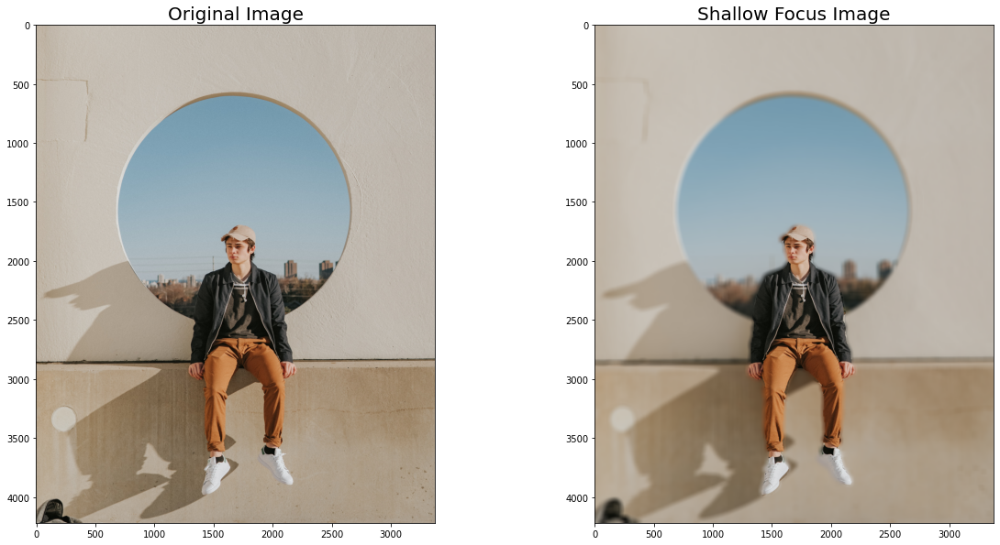

In [12]:
#original image
fig = plt.figure(figsize=(20, 10))

ax = plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(h_img_orig, cv2.COLOR_BGR2RGB))
plt.title('Original Image', fontsize=20)

#combined images
h_img_concat = np.where(h_img_mask_color==255, h_img_orig, h_img_bg_blur)
ax=plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(h_img_concat, cv2.COLOR_BGR2RGB))
plt.title('Shallow Focus Image', fontsize=20)
plt.show()

Left shoulder is a bit blurred and the shoes are blurred as well
#### Why?
When combining images, something must have happened.<br/>


## Importing Image 02: Cat

(1299, 1920, 3)


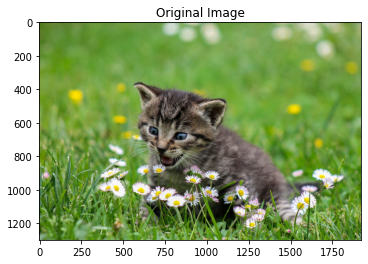

In [13]:
c_img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/cat.jpg'  
c_img_orig = cv2.imread(c_img_path) 

print(c_img_orig.shape)
plt.imshow(cv2.cvtColor(c_img_orig, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.show()

In [14]:
segvalues, output = model.segmentAsPascalvoc(c_img_path)

In [15]:
segvalues

{'class_ids': array([0, 8]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [16]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[8]#cat

array([64,  0,  0])

In [17]:
seg_color = (0, 0, 64) #converting color from BGR to RGB

(1299, 1920)


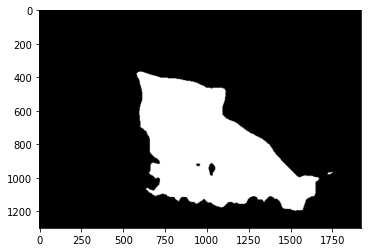

In [18]:
#masking by seg_color, if same then 1(True), if not then 0(False)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

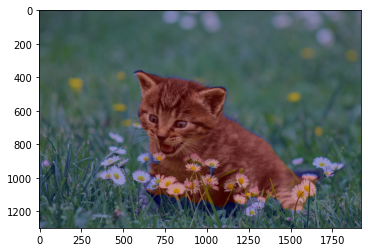

In [19]:
c_img_show = c_img_orig.copy()

c_img_mask = seg_map.astype(np.uint8) * 255

#applying color
c_color_mask = cv2.applyColorMap(c_img_mask, cv2.COLORMAP_JET)

#0.6 and 0.4 are the ratio of original image and mask image
c_img_show = cv2.addWeighted(c_img_show, 0.6, c_color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(c_img_show, cv2.COLOR_BGR2RGB))
plt.show()

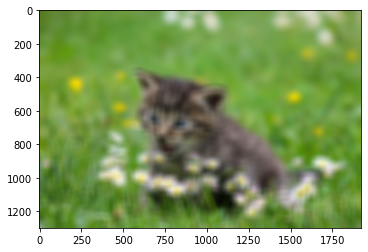

In [20]:
#blur the image
c_img_orig_blur = cv2.blur(c_img_orig, (50,50))  
plt.imshow(cv2.cvtColor(c_img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

(1299, 1920, 3)


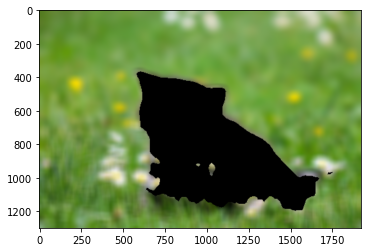

In [21]:
#extract the background of blurred image by using segmentation mask
c_img_mask_color = cv2.cvtColor(c_img_mask, cv2.COLOR_GRAY2BGR)
c_img_bg_mask = cv2.bitwise_not(c_img_mask_color)
c_img_bg_blur = cv2.bitwise_and(c_img_orig_blur, c_img_bg_mask)
plt.imshow(cv2.cvtColor(c_img_bg_blur, cv2.COLOR_BGR2RGB))
print(c_img_bg_blur.shape)
plt.show()

## Comparison

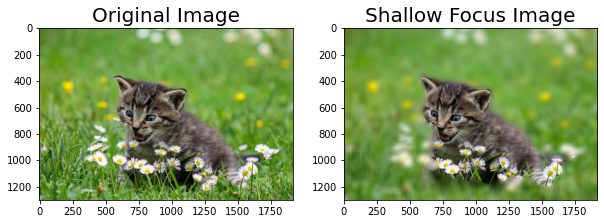

In [22]:
#original image
fig = plt.figure(figsize=(10, 20))

ax = plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(c_img_orig, cv2.COLOR_BGR2RGB))
plt.title('Original Image', fontsize=20)

#combined images
c_img_concat = np.where(c_img_mask_color==255, c_img_orig, c_img_bg_blur)
ax=plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(c_img_concat, cv2.COLOR_BGR2RGB))
plt.title('Shallow Focus Image', fontsize=20)
plt.show()

Some flowers were grouped with the cat

## Importing Image 03: Skateboarding Human

(4191, 3211, 3)


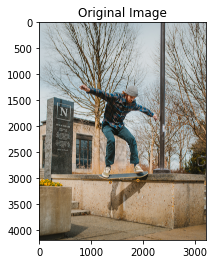

In [23]:
s_img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/person3.jpg'  
s_img_orig = cv2.imread(s_img_path) 

print(s_img_orig.shape)
plt.imshow(cv2.cvtColor(s_img_orig, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.show()

In [24]:
segvalues, output = model.segmentAsPascalvoc(s_img_path)

In [25]:
segvalues

{'class_ids': array([ 0, 15, 16]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [26]:
seg_color = (128, 128, 192) #converting color from BGR to RGB

(4191, 3211)


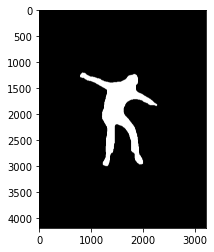

In [27]:
#masking by seg_color, if same then 1(True), if not then 0(False)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

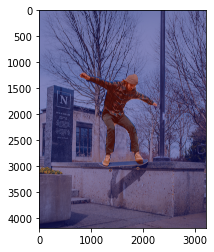

In [28]:
s_img_show = s_img_orig.copy()

s_img_mask = seg_map.astype(np.uint8) * 255

#applying color
s_color_mask = cv2.applyColorMap(s_img_mask, cv2.COLORMAP_JET)

#0.6 and 0.4 are the ratio of original image and mask image
s_img_show = cv2.addWeighted(s_img_show, 0.6, s_color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(s_img_show, cv2.COLOR_BGR2RGB))
plt.show()

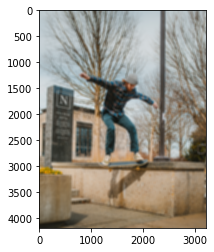

In [29]:
#blur the image
s_img_orig_blur = cv2.blur(s_img_orig, (50,50))  
plt.imshow(cv2.cvtColor(s_img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

(4191, 3211, 3)


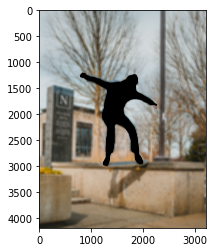

In [30]:
#extract the background of blurred image by using segmentation mask
s_img_mask_color = cv2.cvtColor(s_img_mask, cv2.COLOR_GRAY2BGR)
s_img_bg_mask = cv2.bitwise_not(s_img_mask_color)
s_img_bg_blur = cv2.bitwise_and(s_img_orig_blur, s_img_bg_mask)
plt.imshow(cv2.cvtColor(s_img_bg_blur, cv2.COLOR_BGR2RGB))
print(s_img_bg_blur.shape)
plt.show()

## Comparison

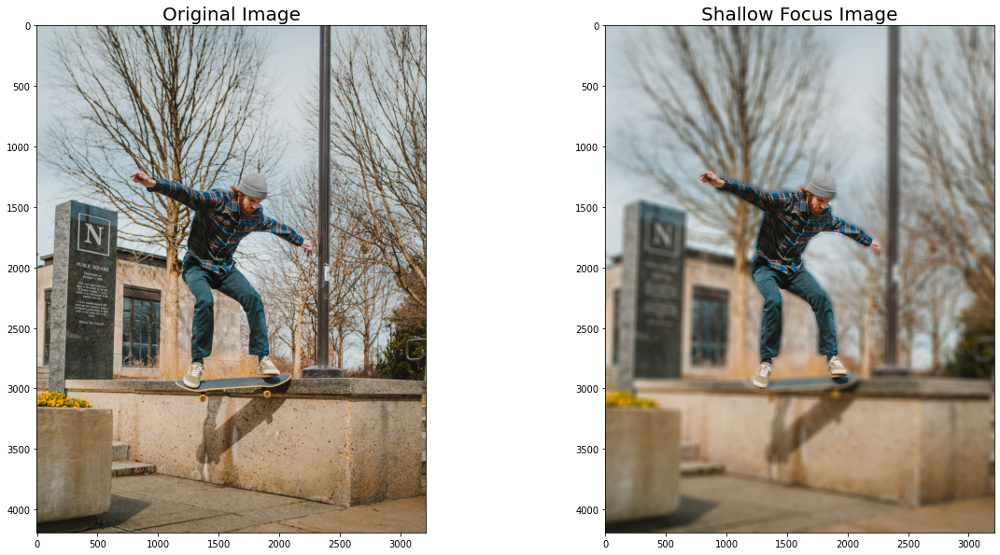

In [31]:
#original image
fig = plt.figure(figsize=(20, 10))

ax = plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(s_img_orig, cv2.COLOR_BGR2RGB))
plt.title('Original Image', fontsize=20)

#combined images
s_img_concat = np.where(s_img_mask_color==255, s_img_orig, s_img_bg_blur)
ax=plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(s_img_concat, cv2.COLOR_BGR2RGB))
plt.title('Shallow Focus Image', fontsize=20)
plt.show()

Doesn't look so bad!

## Replacing Background

(4272, 2848, 3)


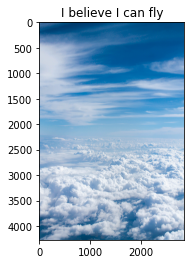

In [32]:
bg_img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/sky.jpg'  
bg_img_orig = cv2.imread(bg_img_path) 

print(bg_img_orig.shape)
plt.imshow(cv2.cvtColor(bg_img_orig, cv2.COLOR_BGR2RGB))
plt.title('I believe I can fly')

plt.show()

In [33]:
#resizing the background image 
target_size = (s_img_orig.shape[1], s_img_orig.shape[0])
bg_resized = cv2.resize(bg_img_orig, target_size)

print('all done')

all done


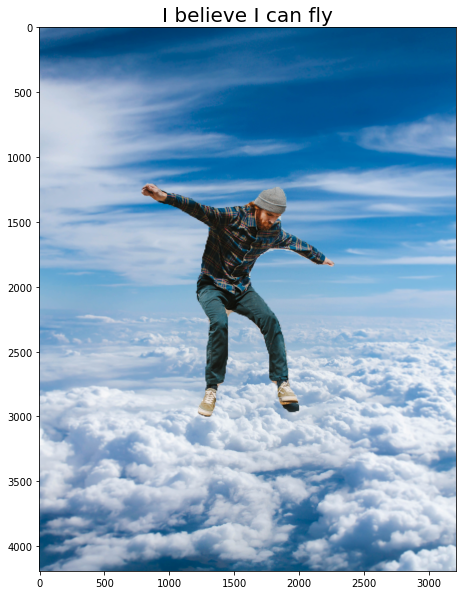

In [34]:
img_mask_color = cv2.cvtColor(s_img_mask, cv2.COLOR_GRAY2BGR)
img_concat3 = np.where(img_mask_color==255, s_img_orig, bg_resized)

fig = plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(img_concat3, cv2.COLOR_BGR2RGB))
plt.title("I believe I can fly", fontsize=20)
plt.show()

---
## Problem

Although semantic segmentation works fine enough, there is always a room for improvement.<br/>
* Unclear boundaries
* Some parts that are cut off
* Shadows are included
* Unnatural

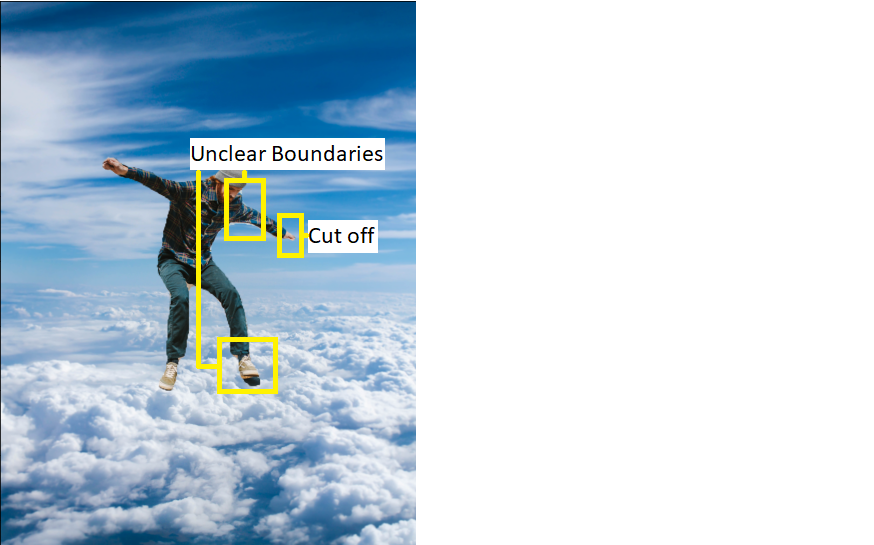

## Solution

From [OpenCV](https://docs.opencv.org/4.x/d4/d13/tutorial_py_filtering.html), there are various ways to 'blur' images such as <br/>
* Averaging
* Gaussian Blurring
* Median Blurring
* Bilateral Filtering

Decided to use Gaussian Blurring instead of `blur` to smooth out the boundaries

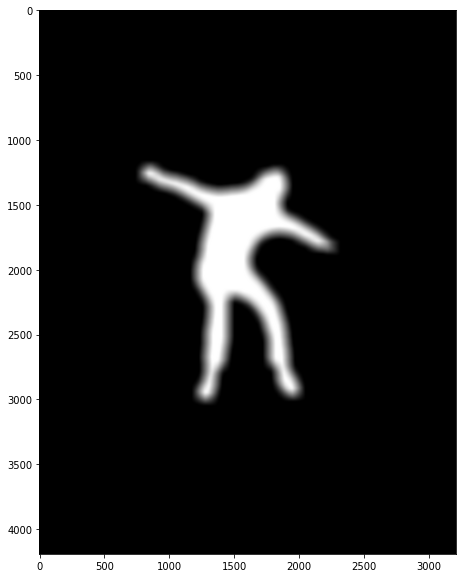

In [35]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/person3.jpg' 
img_orig = cv2.imread(img_path)

segvalues, output = model.segmentAsPascalvoc(s_img_path)

seg_color = (128, 128, 192) #converting color from BGR to RGB

seg_map = np.all(output==seg_color, axis=-1)

img_show = img_orig.copy()
img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

img_mask_up = cv2.resize(img_mask, img_orig.shape[:2][::-1], interpolation=cv2.INTER_LINEAR)

# img_mask_up to 3 channels
img_mask_3C = np.repeat(np.expand_dims(img_mask_up, axis=2), 3, axis=2).astype(np.uint8)

# Guassian blur to orignial image
orig_Gblur = cv2.GaussianBlur(img_orig, (101,101),0) #odd numbers
# Guassian blur to mask image
img_Gmask = (cv2.GaussianBlur(img_mask_3C, (101, 101), 101, 101)/255).astype(np.float32)

# combining original image and the mask image
image_blur = img_Gmask*img_orig.astype(np.float32)

img_bg_mask = (1-img_Gmask)*orig_Gblur.astype(np.float32)
img_output2 = (image_blur+img_bg_mask).astype(np.uint8)

fig = plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img_Gmask, cv2.COLOR_BGR2RGB))
plt.show()

(-0.5, 3210.5, 4190.5, -0.5)

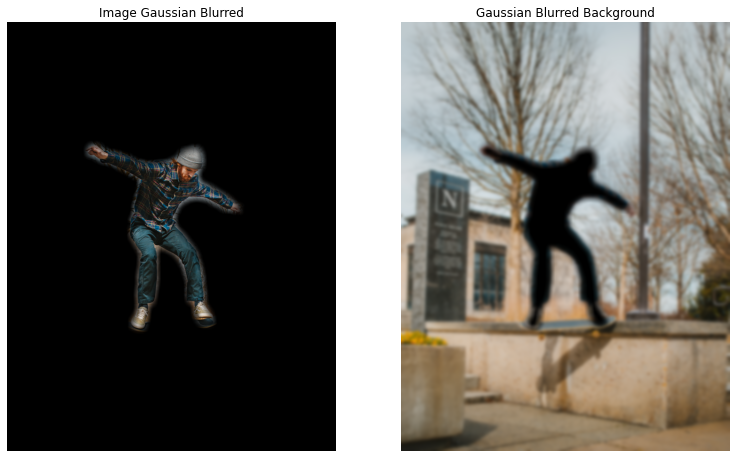

In [36]:
fig = plt.figure(figsize=(20, 10))

ax = plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(image_blur.astype(np.uint8),cv2.COLOR_BGR2RGB))
plt.title('Image Gaussian Blurred')
plt.axis('off')

ax = plt.subplot(1,3,2)
plt.imshow(cv2.cvtColor(img_bg_mask.astype(np.uint8),cv2.COLOR_BGR2RGB))
plt.title('Gaussian Blurred Background')
plt.axis('off')

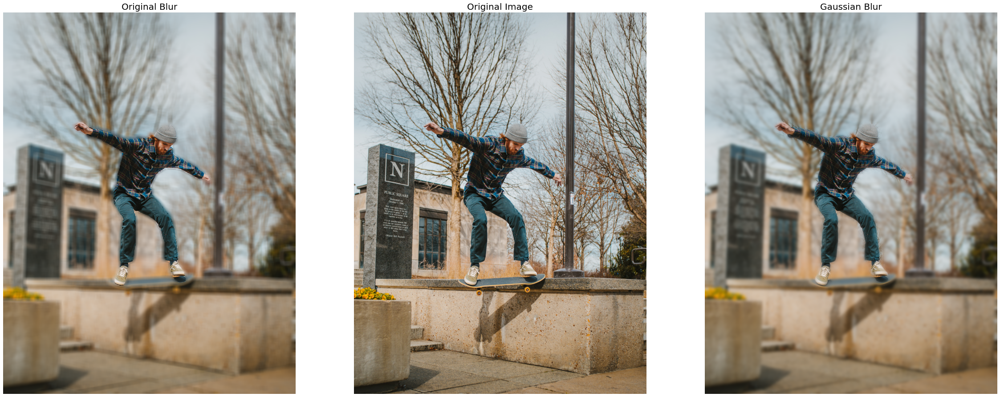

In [37]:
#Compare
fig = plt.figure(figsize=(40, 20)) 

ax = plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(s_img_concat.astype(np.uint8),cv2.COLOR_BGR2RGB))
plt.title('Original Blur', fontsize=20)
plt.axis('off')

ax = plt.subplot(1,3,2)
plt.imshow(cv2.cvtColor(s_img_orig, cv2.COLOR_BGR2RGB))
plt.title('Original Image', fontsize=20)
plt.axis('off')

ax = plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(img_output2.astype(np.uint8),cv2.COLOR_BGR2RGB))
plt.title('Gaussian Blur', fontsize=20)
plt.axis('off')

plt.show()

It's too small to tell the difference

Let's make it bigger

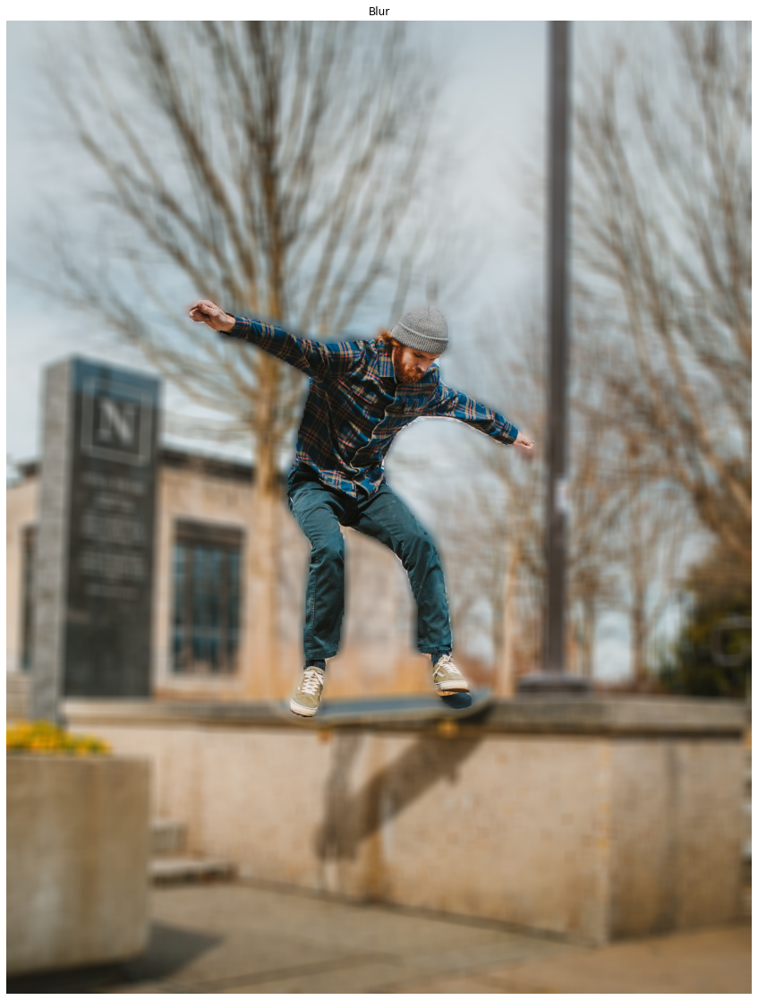

In [38]:
fig = plt.figure(figsize=(40, 20))

plt.imshow(cv2.cvtColor(s_img_concat.astype(np.uint8),cv2.COLOR_BGR2RGB))
plt.title('Blur')
plt.axis('off')

plt.show()

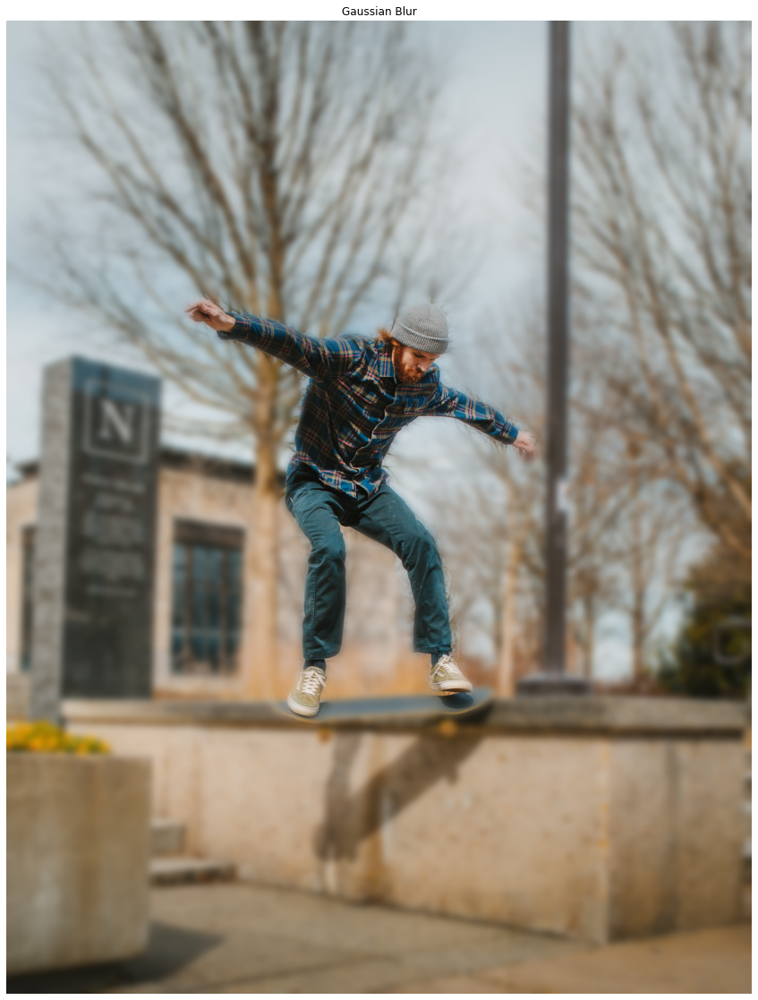

In [39]:
fig = plt.figure(figsize=(40, 20))

plt.imshow(cv2.cvtColor(img_output2.astype(np.uint8),cv2.COLOR_BGR2RGB))
plt.title('Gaussian Blur')
plt.axis('off')

plt.show()

You can tell how soft the boundaries are compared to the original blurred image. <br/>

---

## Conclusion

Using Gaussian Blur made the boundaries smoother but still haven't figured out how to omit the shadows.<br/>
Researched better ways to do this and I found something called the **Panoptic segmentation** <br/>

### Panoptic segmentation

Basically, it's a combination of semantic and instance segmentation.<br/>

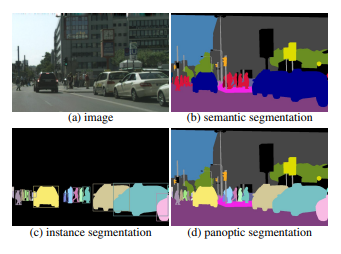
image from [the research paper](https://arxiv.org/pdf/1801.00868.pdf) <br/>

Overall, all three goals were achieved!